<a href="https://colab.research.google.com/github/djmoffat/HOSSS-19/blob/master/HOSS_hacking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install https://github.com/interactiveaudiolab/nussl/archive/clustering.zip
!pip install musdb
!pip install museval

# NUSSL demo

1. Install the requirements using the cell aboe
2. Run on an example audio file with one of our deep clustering audio models below

## Music separation

Matching file found at /tmp/.nussl/audio/schoolboy_fascination_excerpt.wav, skipping download.
Matching file found at /tmp/.nussl/models/vocals_44k_coherent.pth, skipping download.


/usr/local/lib/python3.6/dist-packages/nussl/core/audio_signal.py:1686: UserWarning: Cannot resample to the same sample rate.
  warnings.warn('Cannot resample to the same sample rate.')


/usr/local/lib/python3.6/dist-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


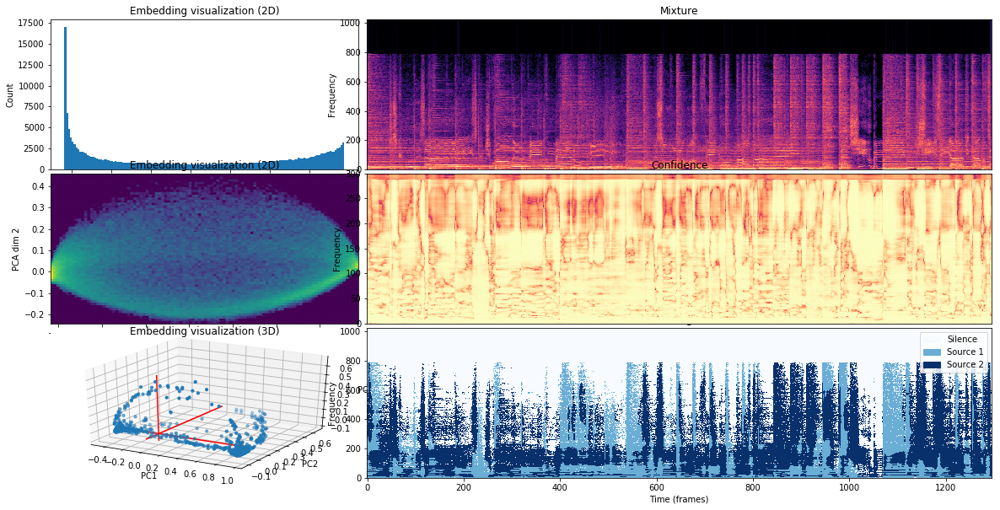

In [0]:
from nussl import efz_utils, jupyter_utils, AudioSignal, DeepClustering
import matplotlib.pyplot as plt
%matplotlib inline

audio_file = efz_utils.download_audio_file('schoolboy_fascination_excerpt.wav')
# see more models and audio files @ http://nussl.ci.northwestern.edu/
model_path = efz_utils.download_trained_model('vocals_44k_coherent.pth')

audio_signal = AudioSignal(audio_file)
separator = DeepClustering(
    audio_signal,
    model_path=model_path,
    num_sources=2,
    clustering_type='kmeans',
    percentile=95,
)
separator.run()

# Mixture
jupyter_utils.embed_audio(audio_signal)
signals = separator.make_audio_signals()
# Each source
for s in signals:
  jupyter_utils.embed_audio(s)
  
plt.figure(figsize=(20, 10))
separator.plot()
plt.tight_layout()
plt.show()

## Speech separation

Matching file found at /tmp/.nussl/audio/wsj_speech_mixture_ViCfBJj.mp3, skipping download.
Matching file found at /tmp/.nussl/models/speech_wsj8k.pth, skipping download.


/usr/local/lib/python3.6/dist-packages/nussl/core/audio_signal.py:1686: UserWarning: Cannot resample to the same sample rate.
  warnings.warn('Cannot resample to the same sample rate.')


/usr/local/lib/python3.6/dist-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


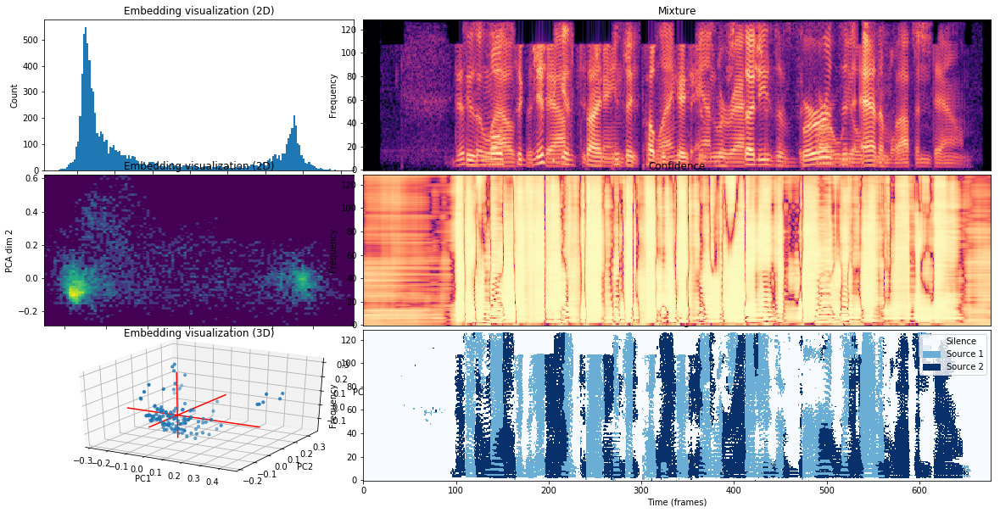

In [0]:
from nussl import efz_utils, jupyter_utils, AudioSignal, DeepClustering
import matplotlib.pyplot as plt
%matplotlib inline

audio_file = efz_utils.download_audio_file('wsj_speech_mixture_ViCfBJj.mp3')
# see more models and audio files @ http://nussl.ci.northwestern.edu/
model_path = efz_utils.download_trained_model('speech_wsj8k.pth')

audio_signal = AudioSignal(audio_file)
separator = DeepClustering(
    audio_signal,
    model_path=model_path,
    num_sources=2,
    clustering_type='kmeans',
    percentile=95,
)
separator.run()

# Mixture
jupyter_utils.embed_audio(audio_signal)
signals = separator.make_audio_signals()
# Each source
for s in signals:
  jupyter_utils.embed_audio(s)
  
plt.figure(figsize=(20, 10))
separator.plot()
plt.tight_layout()
plt.show()